# Read and analyze case 6126 E08 (Ajia)

**BMED320: Methods in biomedical research (IMC-ML)  / 2020-11-04**<br>

See: https://github.com/arvidl/BMED320-imaging-mass-cytometry-ml/blob/master/notebooks/imc-case-damond-2019/README.md

### Import the libraries being used

In [1]:
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from skimage import io
from skimage import color
from skimage import morphology
from skimage.morphology import disk
from skimage.filters import median
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy import ndimage
from skimage.filters import threshold_otsu
from skimage import img_as_ubyte
from skimage import img_as_float
from scipy.ndimage import gaussian_filter
from skimage.morphology import reconstruction
import nibabel as nib
import os
home = os.path.expanduser('~')  # To make path to local home directory
import tifffile as tiff
from pycaret.clustering import *

### Define the data being used

In [2]:
fn_tiff = './data/E08_a0_full.tiff'
fn_csv = './data/E08_a0_full.csv'
fn_panel = './data/table1_IMC_panel_37x4.csv'

# For direct inclusion of figures and tables in the Overleaf on Linux / MacOS and NOT Windows ('nt')
# i.e. LaTeX document (Overleaf is synced with Dropbox on MacOS/Linux)
if os.name == 'nt':
    fn_fig_base = '%s/tmp' % home
    fn_tab_base = '%s/tmp' % home
else:    
    fn_fig_base = '%s/Dropbox/apps/Overleaf/Imaging_Mass_Cytometry_and_Machine_Learning_BMED320_project2020/Figs' % (home)
    fn_tab_base = '%s/Dropbox/apps/Overleaf/Imaging_Mass_Cytometry_and_Machine_Learning_BMED320_project2020' % (home)

### Read the IMC imagefile and print characteristics

In [3]:
im = io.imread(fn_tiff)
print(type(im))
print(im.shape)

<class 'numpy.ndarray'>
(37, 530, 567)


### Get number of channels in the recording

In [4]:
n_chn = im.shape[0]
n_chn

37

### Read the channel names into a Pandas dataframe

In [5]:
df = pd.read_csv(fn_csv, usecols=[0], names=['chn'], header=None)
df.shape

(37, 1)

### Inspect the first 5 and the last 5 channel names

In [6]:
df.head()

,chn
0,In113
1,In115
2,Pr141
3,Nd142
4,Nd143


In [7]:
df.tail()

,chn
32,Yb174
33,Lu175
34,Yb176
35,Ir191
36,Ir193


### Extract the first channel name as a string

In [8]:
print(type(df.chn.iloc[0]))
df.chn.iloc[0]

<class 'str'>


'In113'

### Read the IMC dataset panel information into a dataframe and display the table

In [9]:
df_p = pd.read_csv(fn_panel)
print(df_p.shape)
df_p

(37, 4)


,Short Name,Antigen,Main Target Cells,Metal Tag
0,INS,Insulin,β,141Pr
1,PIN,Proinsulin,β,154Sm
2,GCG,Glucagon,α,156Gd
3,SST,Somatostatin,δ,159Tb
4,PPY,Pancreatic polypeptide,γ,153Eu
5,NKX6-1,Homeobox protein Nkx-6.1,β,169Tm
6,PDX1,Pancreatic and duodenal homeobox 1,β δ ductal,158Gd
7,IAPP,Amylin,β,167Er
8,PCSK2,Proprotein convertase 2,α,144Nd
9,SYP,Synaptophysin,Endocrine,160Gd


### Pandas dataframe to LaTeX table
https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.to_latex.html

In [10]:
print(df_p.to_latex(index=True)) 

\begin{tabular}{lllll}
\toprule
{} & Short Name &                                            Antigen &      Main Target Cells & Metal Tag \\
\midrule
0  &        INS &                                            Insulin &                      β &     141Pr \\
1  &        PIN &                                         Proinsulin &                      β &     154Sm \\
2  &        GCG &                                           Glucagon &                      α &     156Gd \\
3  &        SST &                                       Somatostatin &                      δ &     159Tb \\
4  &        PPY &                             Pancreatic polypeptide &                      γ &     153Eu \\
5  &     NKX6-1 &                           Homeobox protein Nkx-6.1 &                      β &     169Tm \\
6  &       PDX1 &                 Pancreatic and duodenal homeobox 1 &             β δ ductal &     158Gd \\
7  &       IAPP &                                             Amylin &                 

### Write latex table directly to file, then use `\input(table.tex)` in Overleaf 
**remember `\usepackage{booktabs}`**

In [11]:
# Replace greek letter with mathematical greek in the Main Target Cells column
df_p_edit = df_p.copy()

old_list = ['α', 'β', 'δ', 'γ', 'β δ ductal']
new_list = ['$\\alpha$', '$\\beta$', '$\\delta$', '$\\gamma$', '$\\beta$ $\\delta$ ductal']
df_p_edit['Main Target Cells'] = df_p_edit['Main Target Cells'].replace(old_list, new_list)

# And add 1 to the index (i.e. channel numbering)
df_p_edit.index = np.arange(1, len(df_p_edit)+1)
#df_p_edit.index.names = ['Channel']
df_p_edit['Channel'] = df_p_edit.index 

# Reorder columns to start with Channel
cols = list(df_p_edit.columns.values)
print(cols)
cols = [df_p_edit.columns[-1]] + [col for col in df_p_edit if col != df_p_edit.columns[-1]]
print(cols)
df_p_edit = df_p_edit[cols]

['Short Name', 'Antigen', 'Main Target Cells', 'Metal Tag', 'Channel']
['Channel', 'Short Name', 'Antigen', 'Main Target Cells', 'Metal Tag']


**Inspect**

In [12]:
df_p_edit

,Channel,Short Name,Antigen,Main Target Cells,Metal Tag
1,1,INS,Insulin,$\beta$,141Pr
2,2,PIN,Proinsulin,$\beta$,154Sm
3,3,GCG,Glucagon,$\alpha$,156Gd
4,4,SST,Somatostatin,$\delta$,159Tb
5,5,PPY,Pancreatic polypeptide,$\gamma$,153Eu
6,6,NKX6-1,Homeobox protein Nkx-6.1,$\beta$,169Tm
7,7,PDX1,Pancreatic and duodenal homeobox 1,$\beta$ $\delta$ ductal,158Gd
8,8,IAPP,Amylin,$\beta$,167Er
9,9,PCSK2,Proprotein convertase 2,$\alpha$,144Nd
10,10,SYP,Synaptophysin,Endocrine,160Gd


**save to file to sync with Overleaf**

In [13]:
tab_fn = '%s/BMED320_experiments_case6126_E08_panel_table.tex' % fn_tab_base
with open(tab_fn, 'w') as tf:
     tf.write(df_p_edit.to_latex(index=False, escape=False))

### Plot the IMC dataset as a 7 x 6 grid of color-coded channels (and save Fig for the Overleaf document)

With histogram equalization for better visualization
https://stackoverflow.com/questions/28518684/histogram-equalization-of-grayscale-images-with-numpy

In [14]:
df_p_edit['Metal Tag'].iloc[3]

'159Tb'

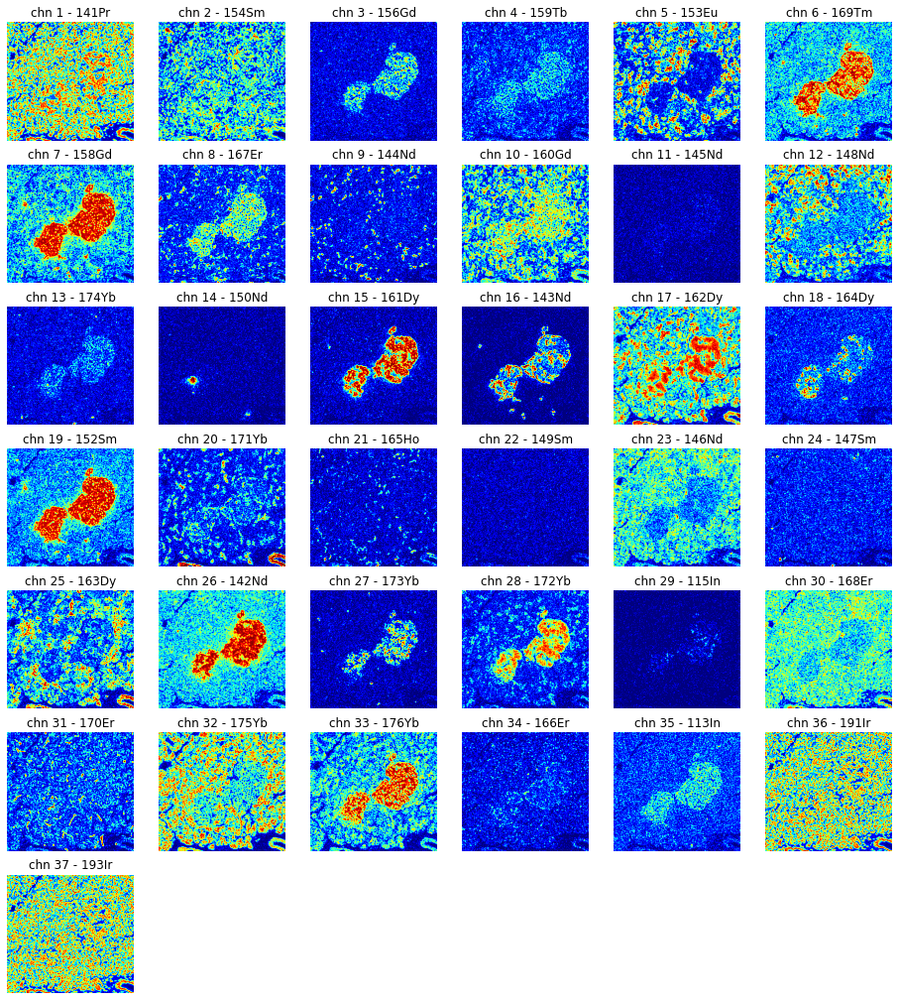

In [15]:
fig_fn = '%s/BMED320_experiments_case6126_E08_channel_eq_mosaic_jet.pdf' % fn_fig_base
fig, axes = plt.subplots(7, 6, figsize=(16, 18), sharex=False, sharey=False)
ax = axes.ravel()
for i, item in enumerate(range(n_chn)):
    chn = np.squeeze(im[i,:,:])
    chn_eq = np.sort(chn.ravel()).searchsorted(chn)  # a kind of histogram equalization
    ax[i].imshow(chn_eq, cmap='jet' )   # cmap='jet', 'gray'
    ax[i].set_title('chn %d - %s' % ((i+1), df_p_edit['Metal Tag'].iloc[i])) #df.chn.iloc[i]))
    ax[i].axis('off')
chn_0 = np.zeros(chn.shape )   
for j in range(n_chn,7*6):
    ax[j].imshow(chn_0, cmap='gray_r') 
    ax[j].axis('off')
plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

### Plot the IMC dataset as a 7 x 6 grid of gray-level-coded channels¶

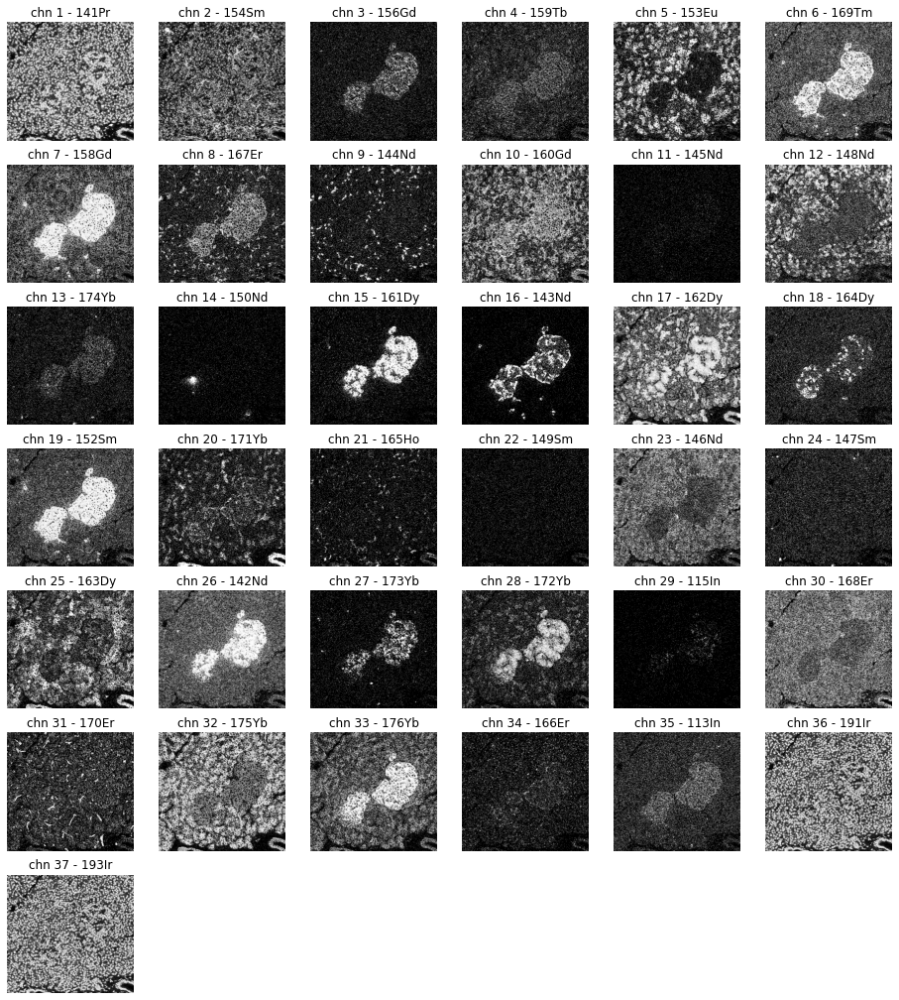

In [16]:
fig_fn = '%s/BMED320_experiments_case6126_E08_channel_eq_mosaic_gray.pdf' % fn_fig_base
fig, axes = plt.subplots(7, 6, figsize=(16, 18), sharex=False, sharey=False)
ax = axes.ravel()
for i, item in enumerate(range(n_chn)):
    chn = np.squeeze(im[i,:,:])
    chn_eq = np.sort(chn.ravel()).searchsorted(chn)
    ax[i].imshow(chn_eq, cmap='gray' )   # cmap='jet', 'gray'
    ax[i].set_title('chn %d - %s' % ((i+1), df_p_edit['Metal Tag'].iloc[i]))
    ax[i].axis('off')
chn_0 = np.zeros(chn.shape )   
for j in range(n_chn,7*6):
    ax[j].imshow(chn_0, cmap='gray_r') 
    ax[j].axis('off')
plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

## Prepare the multichannel IMC image for NIFTI format

In [17]:
im.shape

(37, 530, 567)

In [19]:
def hist_eq(chn):
    return np.sort(chn.ravel()).searchsorted(chn)

In [20]:
imc_img = np.zeros(shape=(im.shape[2], im.shape[1], 1, im.shape[0]))
imc_img_eq = np.zeros(shape=(im.shape[2], im.shape[1], 1, im.shape[0]))
print(imc_img.shape)
for i in range(im.shape[0]):
    a = np.squeeze(im[i,:,:])
    b = np.squeeze(hist_eq(im[i,:,:]))
    imc_img[:,:,0,i] = a[::-1,::-1].T /a.max()
    imc_img_eq[:,:,0,i] = b[::-1,::-1].T /b.max()

(567, 530, 1, 37)


### Make a neuroimaging NIFTI-formated multichannel image 
**(for using neuroimaging display tools like Freesurfer's [FreeView](https://surfer.nmr.mgh.harvard.edu/fswiki/FreeviewGuide/FreeviewGeneralUsage/FreeviewInterface) or FSL's [FSLeyes](https://users.fmrib.ox.ac.uk/~paulmc/fsleyes/userdoc/latest)**

In [21]:
imc_nii = nib.Nifti1Image(imc_img, affine=np.eye(4))
imc_nii_eq = nib.Nifti1Image(imc_img_eq, affine=np.eye(4))  # "histogram equalized channels" image

#### Save this NIFTI image to disk

In [22]:
nib.save(imc_nii, './data/imc_%d_chns.nii.gz' % (im.shape[0]))
nib.save(imc_nii_eq, './data/imc_%d_chns_eq.nii.gz' % (im.shape[0]))

# K-means clustering using `scikit-learn`

Conventional _k_-means requires only a few steps. The first step is to randomly select _k_ centroids, where _k_ is equal to the number of clusters you choose. **Centroids** are data points representing the center of a cluster.

The main element of the algorithm works by a two-step process called **expectation-maximization**. The expectation step assigns each data point to its nearest centroid. Then, the maximization step computes the mean of all the points for each cluster and sets the new centroid. Here’s what the conventional version of the k-means algorithm looks like:

![kmeans-algorithm](https://files.realpython.com/media/kmeans-algorithm.a94498a7ecd2.png)

The quality of the cluster assignments is determined by computing the **sum of the squared error** (**SSE**) after the centroids converge, or match the previous iteration’s assignment. The SSE is defined as the sum of the squared Euclidean distances of each point to its closest centroid. Since this is a measure of error, the objective of _k_-means is to try to minimize this value.

From: https://realpython.com/k-means-clustering-python

### Analyses of all channels jointly (K-means clustering)

In [23]:
# Min and macx and number of voxels in the 2D IMC multichannel image
print('Min:', im.flatten().min())
print('Max:', im.flatten().max())
print('Number of voxels:', im.flatten().size)

Min: 0.0
Max: 1473.511
Number of voxels: 11118870


In [24]:
# Generally, we could use a tissue ROI mask for the slide. 
# We let this ROI be the whole first channel in the slide stack + 1, i.e.
im_msk = im[0,:,:]+1
print(im_msk.flatten().min())
print(im_msk.flatten().max())
im_msk.shape

1.0
378.168


(530, 567)

**Find all pixel locations in the ROI for extracting a dataset X and corresponding pixel locations to a Pandas data frame (dfROI)**

In [25]:
# Find voxel locations (ind_roi) corresponding to tissue ROI (value >=1 inside ROI, 0 else) 
ind_roi = np.where(im_msk > 0) 
X = np.transpose(np.asarray(im[:,ind_roi[0],ind_roi[1]])) # The pixel channel signatures within the ROI
print(X.shape)

(300510, 37)


In [26]:
# Check feature vectors (CyTOF pixel signatures) for the three first pixels
dfROI = pd.DataFrame(X)
dfROI.head(3)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36
0,1.066000,0.000,0.0,0.000,12.395,2.376,1.0,0.000,0.0,4.537,0.0,1.047,0.0,0.0,1.0,0.0,2.360,1.000,2.0,5.076,0.0,0.000,0.000,0.0,2.353,0.000,0.000,0.000,0.0,4.739,2.0,62.405998,6.346,0.0,1.0,2.414000,0.000000
1,11.754000,3.143,0.0,1.000,8.871,5.189,0.0,2.414,0.0,6.969,0.0,1.000,0.0,0.0,0.0,0.0,5.144,1.395,1.0,4.413,0.0,1.802,2.234,0.0,3.367,2.397,0.000,2.926,0.0,2.002,0.0,13.208000,5.364,0.0,0.0,4.589000,18.249001
2,18.483999,1.332,0.0,1.275,3.000,3.032,0.0,0.000,0.0,4.158,0.0,1.000,0.0,0.0,0.0,0.0,16.028,0.000,0.0,2.304,0.0,0.000,1.018,0.0,4.268,2.000,1.923,2.928,0.0,6.211,0.0,1.000000,1.000,0.0,0.0,52.974998,66.415001


In [27]:
# The three last pixels signatures in the enumeration
dfROI.tail(3)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36
300507,29.274000,1.853,1.0,0.0,0.000,1.751,2.413,1.037,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,9.543,0.0,0.0,5.794,0.0,0.0,0.000,0.0,3.000,0.0,0.0,0.0,0.0,2.0,0.0,10.933,3.000,0.0,1.0,30.969999,59.962002
300508,23.422001,0.000,0.0,0.0,1.029,1.344,0.000,0.000,0.0,3.779,0.0,0.0,0.0,0.0,0.0,0.0,2.939,0.0,0.0,6.554,0.0,0.0,1.314,0.0,11.875,1.0,0.0,0.0,0.0,0.0,0.0,9.376,0.000,0.0,0.0,20.679001,35.198002
300509,16.829000,4.459,0.0,0.0,0.000,3.032,0.000,0.000,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,7.856,0.0,1.0,6.620,0.0,0.0,0.000,1.0,2.881,0.0,0.0,0.0,0.0,1.0,0.0,11.806,2.758,0.0,1.0,12.137000,27.128000


**Insert pixel locations in the ROI**

In [28]:
dfROI.insert(loc = len(dfROI.columns),
           column = 'row',
           value = ind_roi[0])  # Row of pixel location
dfROI.insert(loc = len(dfROI.columns),
           column = 'col',
           value = ind_roi[1])  # Col of pixel location

### Unsupervised classification of the 2D+CyTOF IMC data using K-means
Let X be the n x p data matrix, n = numper of samples (pixel signatures), p = feature vector dimension (number of channels)

In [30]:
X.shape

(300510, 37)

In [31]:
chn_names = df.chn
chn_names[:5]

0    In113
1    In115
2    Pr141
3    Nd142
4    Nd143
Name: chn, dtype: object

#### Make data frame from unscaled X to check scaling

In [32]:
dX_unscaled = pd.DataFrame(X, columns=chn_names)
dX_unscaled.describe(percentiles = [0.5]).round(4).T

,count,mean,std,min,50%,max
chn,,,,,,
In113,300510.0,8.5177,9.9722,0.0,5.181,377.1680
In115,300510.0,1.0210,1.8116,0.0,0.000,84.2350
Pr141,300510.0,0.2025,0.6047,0.0,0.000,24.3300
Nd142,300510.0,0.3015,0.6812,0.0,0.000,13.9050
Nd143,300510.0,1.2852,2.9146,0.0,0.000,71.6480
Nd144,300510.0,2.0594,5.3611,0.0,1.000,241.6350
Nd145,300510.0,4.3234,10.2152,0.0,1.000,164.4120
Nd146,300510.0,0.5158,1.3196,0.0,0.000,59.8750
Sm147,300510.0,0.3839,2.1355,0.0,0.000,136.5310


### Scaling* of feature vectors (IMC signals), channel-by-channel wthin the ROI mask
*) Scaling to zero mean and unit standard deviation

In [33]:
scaler = StandardScaler()  
scaler.fit(X.astype(float))

X_scaled = scaler.transform(X.astype(float))  

# Make data frame from scaled X to check scaling
dX_scaled = pd.DataFrame(X_scaled, columns=chn_names)
dX_scaled.head().T

,0,1,2,3,4
chn,,,,,
In113,-0.747246,0.324537,0.999415,0.706600,1.132686
In115,-0.563615,1.171339,0.171656,1.163610,0.540396
Pr141,-0.334873,-0.334873,-0.334873,-0.334873,-0.334873
Nd142,-0.442636,1.025362,1.429061,-0.442636,-0.442636
Nd143,3.811833,2.602732,0.588363,-0.097846,-0.440951
Nd144,0.059062,0.583768,0.181425,0.012429,0.175456
Nd145,-0.325340,-0.423234,-0.423234,-0.236061,-0.423234
Nd146,-0.390886,1.438514,-0.390886,-0.390886,-0.390886
Sm147,-0.179775,-0.179775,-0.179775,0.288491,-0.179775


In [139]:
dX_scaled.describe(percentiles = [0.5]).round(4).T

,count,mean,std,min,50%,max
chn,,,,,,
In113,300510.0,0.0,1.0,-0.8541,-0.3346,36.9679
In115,300510.0,-0.0,1.0,-0.5636,-0.5636,45.9346
Pr141,300510.0,-0.0,1.0,-0.3349,-0.3349,39.9033
Nd142,300510.0,-0.0,1.0,-0.4426,-0.4426,19.9699
Nd143,300510.0,-0.0,1.0,-0.4410,-0.4410,24.1418
Nd144,300510.0,-0.0,1.0,-0.3841,-0.1976,44.6878
Nd145,300510.0,0.0,1.0,-0.4232,-0.3253,15.6717
Nd146,300510.0,0.0,1.0,-0.3909,-0.3909,44.9841
Sm147,300510.0,-0.0,1.0,-0.1798,-0.1798,63.7531


**Fit the K-means model to the data (and time it)**

In [34]:
K = 3  # Number of clusters (7 is "nice")
max_iter = 300 # Max number of iteration
tol = 0.0001 # Tolerance
kmeans_model = KMeans(n_clusters=K, random_state=42, max_iter=max_iter, tol=tol)
print(kmeans_model)

KMeans(n_clusters=3, random_state=42)


In [35]:
%%time
kmeans_fit = kmeans_model.fit(X_scaled)

CPU times: user 37.6 s, sys: 953 ms, total: 38.6 s
Wall time: 2.67 s


In [36]:
print(kmeans_fit.labels_)
print('First centroid in p-dimensional feature vector space:\n', kmeans_fit.cluster_centers_[0,:])

[1 1 2 ... 2 2 2]
First centroid in p-dimensional feature vector space:
 [-0.0490794  -0.12950276  1.24679613  0.68843688 -0.31644633  2.0320387
  2.76417852  0.82547607 -0.04782499  0.85367874  0.20587082 -0.16624042
  0.5132456   0.13726019  1.51509563  1.38012404  1.00476985  0.89965362
  2.89867031  0.18657654  0.00714536  0.04953365 -0.05522623  0.07755037
 -0.12855642  1.84007121  1.41953496  1.4951212   0.51681775 -0.06527434
  0.0678662  -0.21092321  2.31320312  0.17855404  0.78949861 -0.34773327
 -0.35622451]


In [37]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


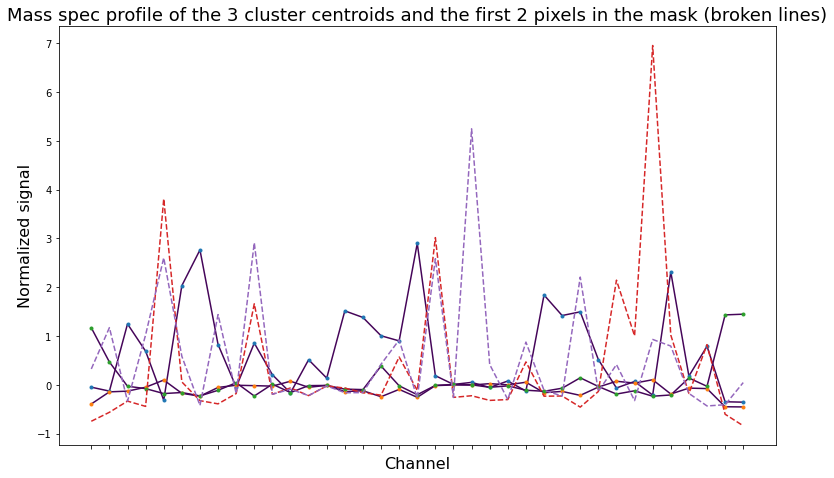

In [38]:
# Plot the cluster centroids as line plots

#plt.style.use('seaborn-ticks')
nv = 2

my_cmap = mpl.colors.ListedColormap(['red', '#000000','#444444', '#666666', '#ffffff', 'blue', 'orange'])
my_cmap_v = plt.cm.viridis(K)

fig, ax = plt.subplots(1,1)

fig.set_size_inches(12, 7)

plt.plot(kmeans_fit.cluster_centers_.T, color=my_cmap_v)
plt.plot(kmeans_fit.cluster_centers_.T, '.')
plt.plot(X_scaled[:nv, :].T, '--')
plt.xlabel('Channel', fontsize=16)
ax.set_xticks([x for x in range(X_scaled.shape[1])])
ax.set_xticklabels([], rotation='vertical', fontsize=18)
plt.ylabel('Normalized signal', fontsize=16)
#plt.xlim(0, 3)
plt.title('Mass spec profile of the %d cluster centroids and the first %d pixels in the mask (broken lines)' % (K, nv), fontsize=18)

plt.subplots_adjust(bottom=.12, top=.95, right=.95, left=.12)

plt.show()

**Make a k-means segmented image (segmentation restricted to the ROI)**

In [39]:
kmeans_segm = 0 * im_msk.copy()
print('Size of segmented image:', kmeans_segm.shape)
print('min:', kmeans_fit.labels_.min())
print('max:', kmeans_fit.labels_.max())
print('Number of clustered samples within ROI:', len(ind_roi[0]))

Size of segmented image: (530, 567)
min: 0
max: 2
Number of clustered samples within ROI: 300510


**Assign the cluster belonging to each voxel within the ROI**

In [40]:
for v in range(len(ind_roi[0])):
    kmeans_segm[ind_roi[0][v], ind_roi[1][v]] = kmeans_fit.labels_[v]

In [41]:
# https://gist.github.com/jakevdp/91077b0cae40f8f8244a  By Jake VanderPlas
def discrete_cmap(N, base_cmap=None):
    """Create an N-bin discrete colormap from the specified input map"""

    # Note that if base_cmap is a string or None, you can simply do
    #    return plt.cm.get_cmap(base_cmap, N)
    # The following works for string, None, or a colormap instance:

    base = plt.cm.get_cmap(base_cmap)
    color_list = base(np.linspace(0, 1, N))
    cmap_name = base.name + str(N)
    return base.from_list(cmap_name, color_list, N)

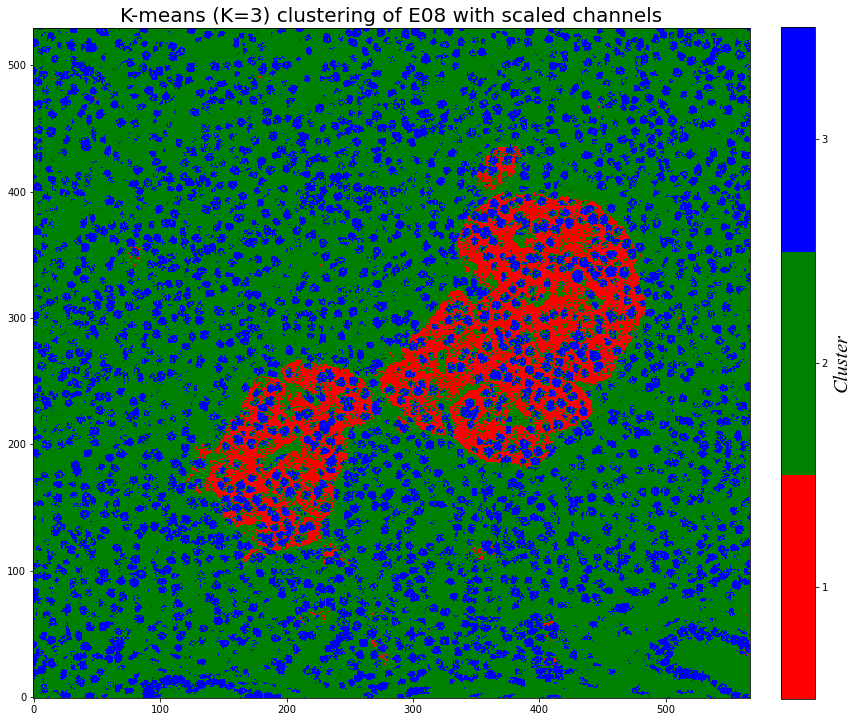

In [77]:
fig_fn = '%s/BMED320_experiments_case6126_E08_K_means_clustering_with_K_3.pdf' % fn_fig_base

fig, axes = plt.subplots(1,1, figsize=(14,14))

# Possible colormaps: 'gray', 'jet', 'cubehelix', 
if K==7:
    my_cmap = mpl.colors.ListedColormap(['red', '#000000','#444444', '#666666', '#ffffff', 'blue', 'orange'])
elif K==3:
    my_cmap = mpl.colors.ListedColormap(['red','green','blue'])
else:
    my_cmap = 'jet'
    
#plt.imshow(np.flip(kmeans_segm[:, :], axis=0), cmap=discrete_cmap(K, 'gray'), origin='lower') 
plt.imshow(np.flip(kmeans_segm[:, :], axis=0), cmap=my_cmap, origin='lower') 

# See: https://stackoverflow.com/questions/18195758/set-matplotlib-colorbar-size-to-match-graph
im_ratio = kmeans_segm.shape[0]/kmeans_segm.shape[1]
cb = plt.colorbar(label='Cluster', orientation='vertical', fraction=0.046*im_ratio, pad=0.04)
ax = cb.ax
text = ax.yaxis.label
font = mpl.font_manager.FontProperties(family='times new roman', style='italic', size=20)
text.set_font_properties(font)

plt.clim(-0.5, K - 0.5)
labels = np.arange(0,K,1)
cb.set_ticks(labels)
cb.set_ticklabels(labels+1)  # cluster numbering from 1,2,...,K
plt.title('K-means (K=%d) clustering of E08 with scaled channels' % (K), size=20)
plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

### Choosing the Appropriate Number of Clusters
There are two methods that are commonly used to evaluate the appropriate number of clusters:

- The **elbow method**
- The **silhouette coefficient**

These are often used as complementary evaluation techniques rather than one being preferred over the other. To perform the **elbow method**, run several _k_-means, increment _k_ with each iteration, and record the SSE:

In [43]:
%%time
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(X_scaled)
    print('K =', k, 'SSE =', kmeans.inertia_)
    sse.append(kmeans.inertia_)

K = 1 SSE = 11118870.00000393
K = 2 SSE = 9995951.916494936
K = 3 SSE = 9421984.75253879
K = 4 SSE = 9073730.691493928
K = 5 SSE = 8812626.710806435
K = 6 SSE = 8590533.339506952
K = 7 SSE = 8408911.826502776
K = 8 SSE = 8188282.397457687
K = 9 SSE = 8061194.008143309
K = 10 SSE = 7901750.555723439
CPU times: user 12min 22s, sys: 16.1 s, total: 12min 38s
Wall time: 49.4 s


There’s a sweet spot where the SSE curve starts to bend known as the **elbow point**. The x-value of this point is thought to be a reasonable trade-off between error and number of clusters. 

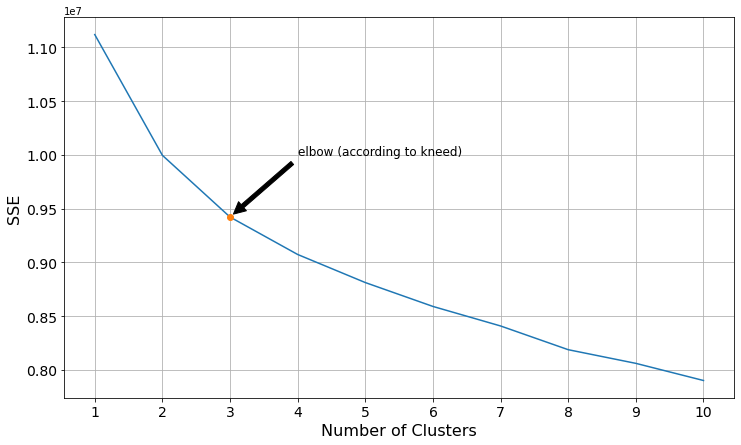

In [67]:
fig_fn = '%s/BMED320_experiments_case6126_E08_kneed_elbow_number_of_clusters.pdf' % fn_fig_base
#plt.style.use("fivethirtyeight")

fig, ax = plt.subplots(1,1)
fig.set_size_inches(12, 7)
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters", size=16)
plt.ylabel("SSE", size=16)
plt.xticks(fontsize=14, rotation=0)
plt.yticks(fontsize=14, rotation=0)

#annotation
plt.plot([3], [sse[3-1]], 'o')
plt.annotate('elbow (according to kneed)', xy=(3, sse[3-1]), xytext=(3+1, sse[3-2]), fontsize=12,
            arrowprops=dict(facecolor='black', shrink=0.05))

plt.grid()
plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

If the elbow point of the curve is difficult to decide, one could use the Python package [`kneed`](https://github.com/arvkevi/kneed), to identify the elbow point programmatically.

In [53]:
from kneed import KneeLocator
kl = KneeLocator(
    range(1, 11), sse, curve="convex", direction="decreasing"
)

print('Sweet spot elbow point: K=', kl.elbow)

Sweet spot elbow point: K= 3


The **silhouette coefficient** is a measure of cluster cohesion and separation. It quantifies how well a data point fits into its assigned cluster based on two factors:

- How close the data point is to other points in the cluster
- How far away the data point is from points in other clusters
Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters.

In the scikit-learn [implementation](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html) of the silhouette coefficient, the average silhouette coefficient of all the samples is summarized into one score. The silhouette score() function needs a minimum of two clusters, or it will raise an exception. More specifically:

The Silhouette Coefficient is calculated using the mean intra-cluster distance (a) and the mean nearest-cluster distance (b) for each sample. The Silhouette Coefficient for a sample is (b - a) / max(a, b). To clarify, b is the distance between a sample and the nearest cluster that the sample is not a part of. Note that Silhouette Coefficient is only defined if number of labels is 2 <= n_labels <= n_samples - 1.


Loop through values of k again, computing the silhouette coefficient (takes a LOOONG time i.e. ~2 hr wall time):

```python
%%time
from sklearn.metrics import silhouette_score

# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(X_scaled)
    score = silhouette_score(X_scaled, kmeans.labels_)
    print('K =', k, 'silhouette score =', score)
    silhouette_coefficients.append(score)
```

```
K = 2 silhouette score = 0.44510556032557064
K = 3 silhouette score = 0.13272987832688307
K = 4 silhouette score = 0.13636804789058554
K = 5 silhouette score = 0.1394940962768057
K = 6 silhouette score = 0.13849795323564695
K = 7 silhouette score = 0.1409242340951432
K = 8 silhouette score = 0.07781204586066344
K = 9 silhouette score = 0.06489030156571994
K = 10 silhouette score = 0.07091744256577782
CPU times: user 5h 11min 1s, sys: 51min 15s, total: 6h 2min 16s
Wall time: 1h 56min 58s
```

Plotting the average silhouette scores for each _k_ shows that the best choice for _k_ is 3 since it has the maximum score:

In [47]:
silhouette_coefficients = [0.44510556032557064,
 0.13272987832688307,
 0.13636804789058554,
 0.1394940962768057,
 0.13849795323564695,
 0.1409242340951432,
 0.07781204586066344,
 0.06489030156571994,
 0.07091744256577782]

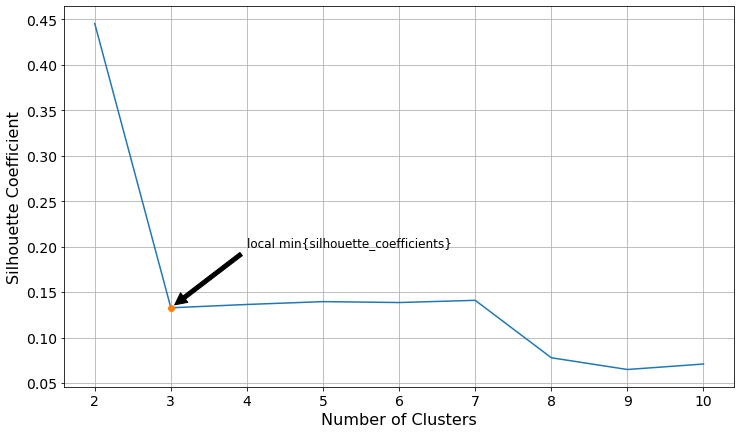

In [84]:
fig_fn = '%s/BMED320_experiments_case6126_E08_silhouette_coefficient_number_of_clusters.pdf' % fn_fig_base
#plt.style.use("fivethirtyeight")

fig, ax = plt.subplots(1,1)
fig.set_size_inches(12, 7)


plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters", size=16)
plt.ylabel("Silhouette Coefficient", size=16)
plt.xticks(fontsize=14, rotation=0)
plt.yticks(fontsize=14, rotation=0)

# annotation
y_adhoc = 0.2
plt.plot([3], [silhouette_coefficients[3-2]], 'o')
plt.annotate('local min{silhouette_coefficients}', xy=(3, silhouette_coefficients[3-2]), 
             xytext=(3+1, y_adhoc), fontsize=12,
            arrowprops=dict(facecolor='black', shrink=0.05))

plt.grid()
plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

Ultimately, your decision on the number of clusters to use should be guided by a combination of domain knowledge and clustering evaluation metrics.

### K-means segmentation showing selected feature channels

In [91]:
K = 9  # Number of clusters (3 is elbow point, 9 is silhouette, 7 is "nice")
max_iter = 300 # Max number of iteration
tol = 0.0001 # Tolerance
kmeans_model = KMeans(n_clusters=K, random_state=42, max_iter=max_iter, tol=tol)
print(kmeans_model)

KMeans(n_clusters=9, random_state=42)


In [92]:
%%time
kmeans_fit = kmeans_model.fit(X_scaled)

CPU times: user 1min 55s, sys: 2.2 s, total: 1min 57s
Wall time: 7.88 s


In [93]:
kmeans_segm = 0 * im_msk.copy()

In [94]:
for v in range(len(ind_roi[0])):
    kmeans_segm[ind_roi[0][v], ind_roi[1][v]] = kmeans_fit.labels_[v]

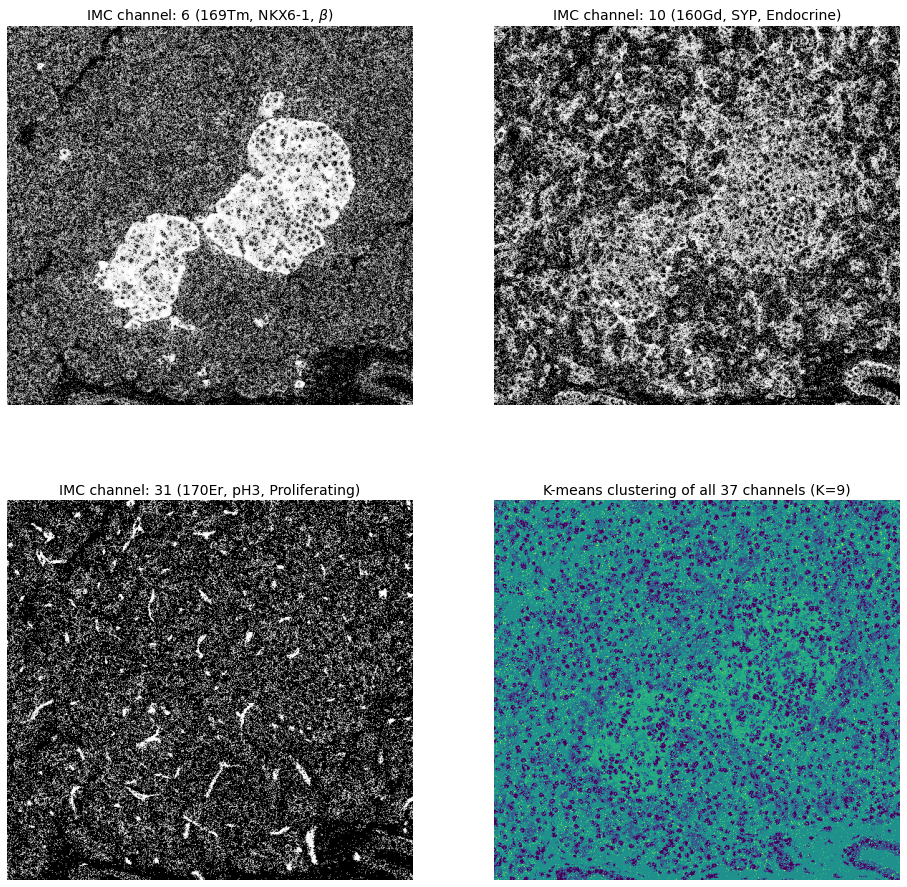

In [97]:
fig_fn = '%s/BMED320_experiments_case6126_E08_selected_channels_and_k_means_clustering.pdf' % fn_fig_base

# Select channels (-1 i.e. we are starting at channel 0)
c = [5, 9, 30]

def hist_eq(chn):
    return np.sort(chn.ravel()).searchsorted(chn)


fig, axes = plt.subplots(2,2, figsize=(16,16))
ax = axes.ravel()
chn = np.flip(np.squeeze(im[c[0],:,:]), axis=0)
ax[0].imshow(hist_eq(chn), cmap='gray', origin='lower')
ax[0].set(xlabel="")
ax[0].axis('off')
ax[0].set_title('IMC channel: %d (%s, %s, %s)' % (c[0]+1,
                                                df_p_edit['Metal Tag'].iloc[c[0]],
                                                df_p_edit['Short Name'].iloc[c[0]],
                                                df_p_edit['Main Target Cells'].iloc[c[0]]), size=14)

chn = np.flip(np.squeeze(im[c[1],:,:]), axis=0)
ax[1].imshow(hist_eq(chn), cmap='gray', origin='lower')
ax[1].set(xlabel="")
ax[1].axis('off')
ax[1].set_title('IMC channel: %d (%s, %s, %s)' % (c[1]+1,
                                                df_p_edit['Metal Tag'].iloc[c[1]],
                                                df_p_edit['Short Name'].iloc[c[1]],
                                                df_p_edit['Main Target Cells'].iloc[c[1]]), size=14)

chn = np.flip(np.squeeze(im[c[2],:,:]), axis=0)
ax[2].imshow(hist_eq(chn), cmap='gray', origin='lower')
ax[2].set(xlabel="")
ax[2].axis('off')
ax[2].set_title('IMC channel: %d (%s, %s, %s)' % (c[2]+1, 
                                        df_p_edit['Metal Tag'].iloc[c[2]],
                                        df_p_edit['Short Name'].iloc[c[2]],
                                        df_p_edit['Main Target Cells'].iloc[c[2]]), size=14)                                          

ax[3].imshow(np.flip(kmeans_segm[:, :], axis=0), cmap='viridis', origin='lower')  #'viridis', 'gray'
ax[3].set_title('K-means clustering of all %d channels (K=%d)' % (n_chn, K), size=14)
ax[3].axis('off')

#plt.tight_layout
plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

## Display DNA only (cell nuclei)  i.e. chn 36 (Ir191) and chn 37 (Ir193)
Hint from Jørn Skavland (Jorn.Skavland@uib.no) Oct 1st 2020 at https://www.uib.no/en/ccbio/136800/hyperion-imaging-system

### Cell nuclei segmentation using point-wise max of DNA channel signal and 
### Histogram-based thresholding (Otsu's method) https://en.wikipedia.org/wiki/Otsu%27s_method
(for better segmentation we could consider a two-dimensional Otsu's method, or adaptive thresholding)

See also:
- https://github.com/selamgit/Irregular-Grid-for-Local-Otsu-Segmentation
- https://github.com/pedrofrodenas/image-thresholding-OCR
- https://github.com/Liang-yc/IntegralThreshold
- https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_Image_Global_Thresholding_Adaptive_Thresholding_Otsus_Binarization_Segmentations.php

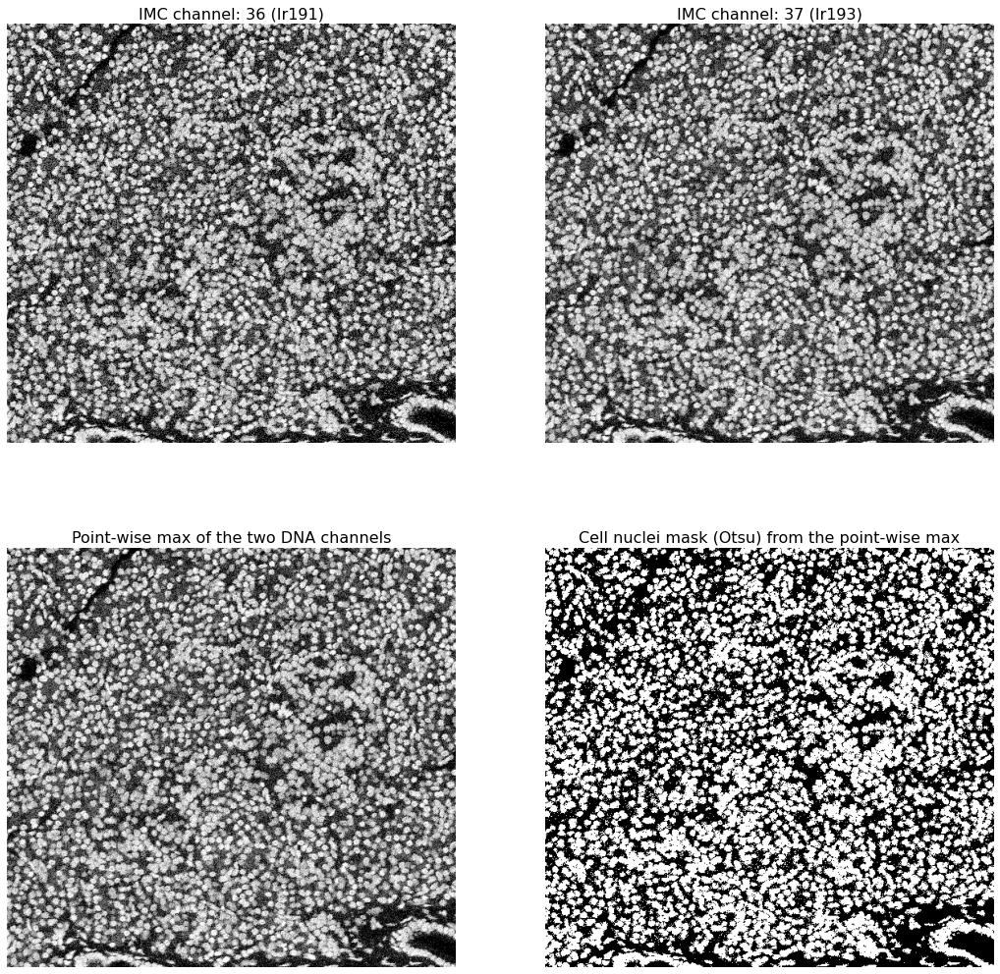

In [17]:
fig_fn = '%s/BMED320_experiments_case6126_E08_DNA_channels_otsu_binarization.pdf' % fn_fig_base

# Select channels (-1 i.e. we are starting at channel 0)
c = [35, 36]

def hist_eq(chn):
    return np.sort(chn.ravel()).searchsorted(chn)

fig, axes = plt.subplots(2,2, figsize=(18,18))
ax = axes.ravel()
chn0 = np.flip(np.squeeze(im[c[0],:,:]), axis=0)
ax[0].imshow(hist_eq(chn0), cmap='gray', origin='lower')
ax[0].set(xlabel="")
ax[0].axis('off')
ax[0].set_title('IMC channel: %d (%s)' % (c[0]+1, df.chn.iloc[c[0]]), size=16)

chn1 = np.flip(np.squeeze(im[c[1],:,:]), axis=0)
ax[1].imshow(hist_eq(chn1), cmap='gray', origin='lower')
ax[1].set(xlabel="")
ax[1].axis('off')
ax[1].set_title('IMC channel: %d (%s)' % (c[1]+1, df.chn.iloc[c[1]]), size=16)

#chn = (chn0+chn1)/2   mean
chn = np.maximum(chn0, chn1)  # point-wise maximum of the two DNA channels
ax[2].imshow(hist_eq(chn), cmap='gray', origin='lower')
ax[2].set(xlabel="")
ax[2].axis('off')
ax[2].set_title('Point-wise max of the two DNA channels', size=16)

t = threshold_otsu(hist_eq(chn))
mask = hist_eq(chn) > t
# mask = ndimage.median_filter(hist_eq(chn)

# ax[3].imshow(mask, cmap='viridis', origin='lower')  #'viridis', 'gray'
ax[3].imshow(mask, cmap='gray', origin='lower')  #'viridis', 'gray'
ax[3].set_title('Cell nuclei mask (Otsu) from the point-wise max', size=16)
ax[3].axis('off')

plt.savefig(fig_fn, bbox_inches='tight')
plt.show()

In [53]:
# The cell candidate mask (to be saved to TIFF)
print(mask.min(), mask.max())
mask = np.flip(img_as_ubyte(mask), axis=0)
print(mask.min(), mask.max())

0 255
0 255


In [54]:
# Save cell mask as tiff
#tiff.imsave('%s/Desktop/cell_mask.tiff' % (home), mask)
tiff.imsave('./data/E08_cell_candidate_mask.tiff', mask)

### Cell segmentation using the 3 nucleus channels: Histone H3  nuclei (chn1) and DNA (chn36, chn 37)

###  Experiments with maskSLIC from `scikit-image`

SLIC = Simple Linear Iterative Clustering <br>

Cf.https://scikit-image.org/docs/dev/api/skimage.segmentation.html?highlight=slic#skimage.segmentation.slic

See also 
- https://www.epfl.ch/labs/ivrl/research/slic-superpixels/#SLICO
- https://scikit-image.org/docs/dev/auto_examples/segmentation/plot_mask_slic.html#sphx-glr-auto-examples-segmentation-plot-mask-slic-py
- https://github.com/darshitajain/SLIC

This experiment is about comparing the segmentations obtained using the plain SLIC method [1] and its masked version maskSLIC [2].

The maskSLIC method is an extension of the SLIC method for the generation of superpixels in a region of interest. maskSLIC is able to overcome border problems that affects SLIC method, particularely in case of irregular mask.


[1] Radhakrishna Achanta, Appu Shaji, Kevin Smith, Aurelien Lucchi, Pascal Fua, and Sabine Suesstrunk, SLIC Superpixels Compared to State-of-the-art Superpixel Methods, [TPAMI](https://ieeexplore.ieee.org/document/6205760), May 2012. DOI:10.1109/TPAMI.2012.120

[2] Irving, Benjamin. “maskSLIC: regional superpixel generation with application to local pathology characterisation in medical images.”, 2016, [arXiv:1606.09518](https://arxiv.org/abs/1606.09518)

```
Segments image using k-means clustering in Color-(x,y,z) space:

skimage.segmentation.slic(image, n_segments=100, compactness=10.0, max_iter=10, sigma=0, spacing=None, 
multichannel=True, convert2lab=None, enforce_connectivity=True, min_size_factor=0.5, max_size_factor=3, slic_zero=False, start_label=None, mask=None)

n_segments - The (approximate) number of labels in the segmented output image

compactness - Balances color proximity and space proximity. Higher values give more weight to space proximity, making superpixel shapes more square/cubic. In SLICO mode, this is the initial compactness. 
This parameter depends strongly on image contrast and on the shapes of objects in the image. 
We recommend exploring possible values on a log scale, e.g., 0.01, 0.1, 1, 10, 100, before refining around a chosen value

max_iter - Maximum number of iterations of k-means

sigma - Width of Gaussian smoothing kernel for pre-processing for each dimension of the image. 
The same sigma is applied to each dimension in case of a scalar value. Zero means no smoothing. Note, that sigma is automatically scaled if it is scalar and a manual voxel spacing is provided

````

In [55]:
# Select channels (-1 i.e. we are starting at channel 0)
c = [0, 35, 36]

#### Make a multichannel "RGB" image and mask using mathematical morphology

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


img: (530, 567, 3) 0.0 300509.0
lum: (530, 567) 0.0 0.9997831725505726
mmask: (530, 567) 0 1


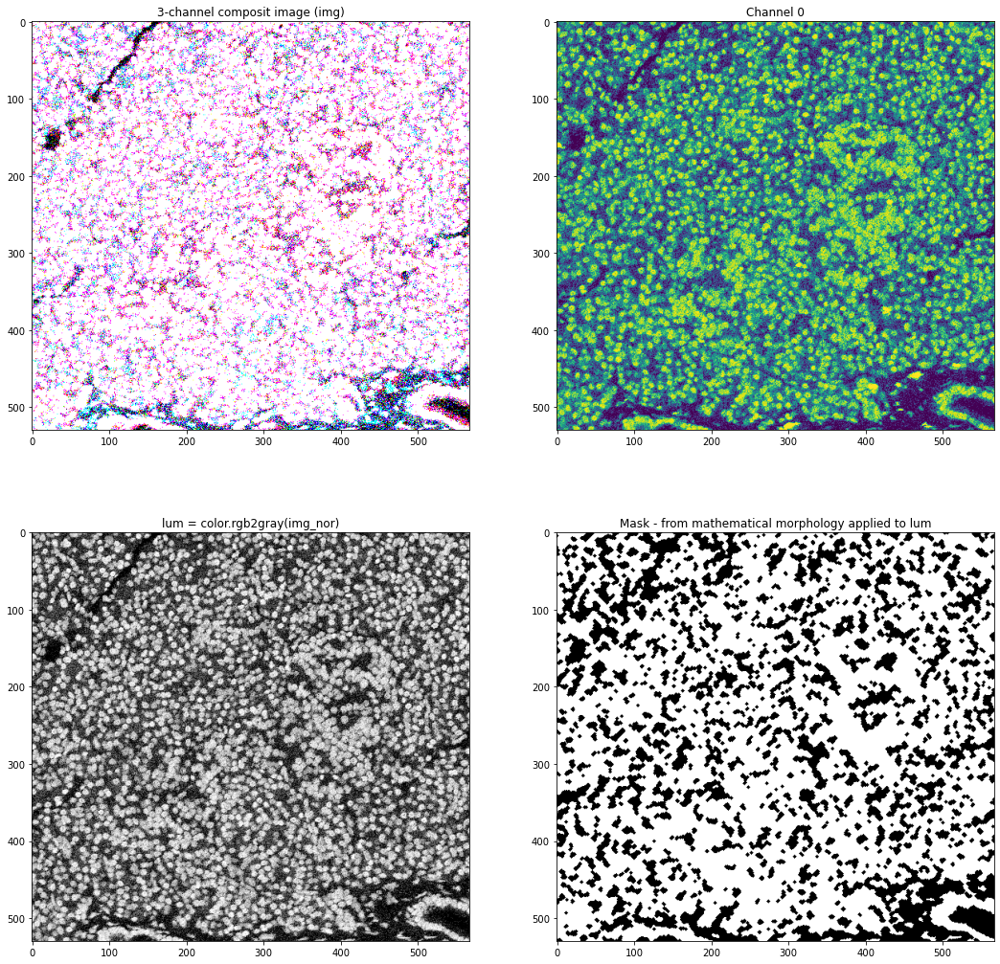

In [56]:
from skimage import data
from skimage import color
from skimage import morphology
from skimage import segmentation


img = np.zeros((im.shape[1],im.shape[2],3), dtype=float)
img[:,:,0] = hist_eq(np.squeeze(im[c[0],:,:]))
img[:,:,1] = hist_eq(np.squeeze(im[c[1],:,:]))
img[:,:,2] = hist_eq(np.squeeze(im[c[2],:,:]))
img_nor = img / np.max(img)


aa = 0.4    # 0.7
bb = 10     # 500
cc = 10     # 500
dd = 2      # 3

lum = color.rgb2gray(img_nor)

mmask = morphology.remove_small_holes(morphology.remove_small_objects(lum < aa, bb), cc)
mmask = 1- morphology.opening(mmask, morphology.disk(dd))

print("img:", img.shape, img.min(), img.max())
print("lum:", lum.shape, lum.min(), lum.max())
print("mmask:", mmask.shape, mmask.min(), mmask.max())

fig = plt.subplots(2,2, figsize=(18,18))
plt.subplot(2,2,1)
plt.imshow(img)
plt.title("3-channel composit image (img)")
plt.subplot(2,2,2)
plt.imshow(img[:,:,0], cmap='viridis')
plt.title("Channel %d" % (c[0]))
plt.subplot(2,2,3)
plt.imshow(lum, cmap='gray')
plt.title("lum = color.rgb2gray(img_nor)")
plt.subplot(2,2,4)
plt.imshow(mmask, cmap='gray')
plt.title("Mask - from mathematical morphology applied to lum")

plt.show()


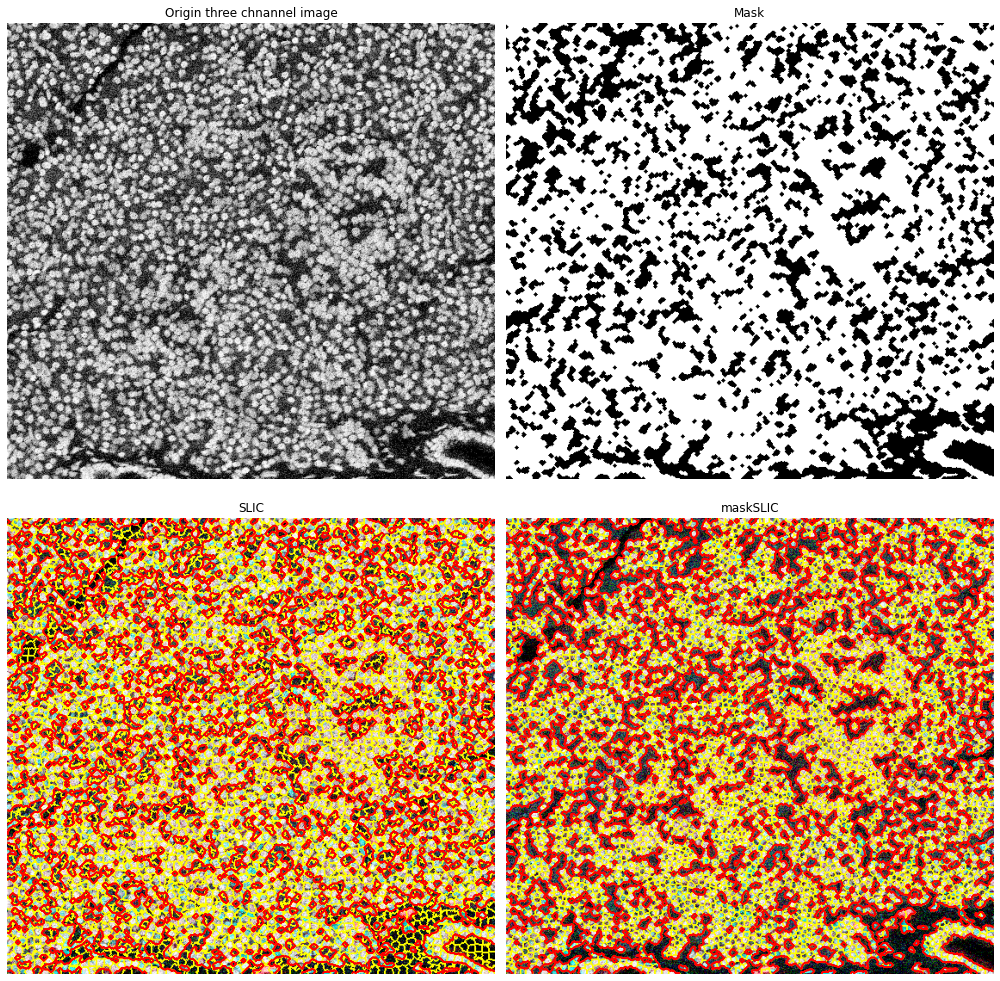

CPU times: user 34.6 s, sys: 92 ms, total: 34.7 s
Wall time: 34.6 s


In [57]:
%%time
n_segments = 5000  # 200
m_n_segments = 5000 # 100

compactness =  50   # 0.01, 0.1, 1, 10, 100   [default 10.0]

# SLIC result
slic = segmentation.slic(img_nor, n_segments=n_segments, compactness=compactness, start_label=1)

# maskSLIC result
m_slic = segmentation.slic(img_nor, 
                           n_segments=m_n_segments,
                           max_iter=100,
                           spacing=None,
                           multichannel=True,
                           sigma=10.5,
                           compactness=compactness,
                           enforce_connectivity=True,
                           slic_zero=False,
                           mask=mmask, 
                           start_label=1)

# Display result
fig, ax_arr = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(14, 14))
ax1, ax2, ax3, ax4 = ax_arr.ravel()

ax1.imshow(lum, cmap='gray')
ax1.set_title("Origin three chnannel image")

ax2.imshow(mmask, cmap="gray")
ax2.set_title("Mask")

ax3.imshow(segmentation.mark_boundaries(img_nor, slic))
ax3.contour(mmask, colors='red', linewidths=1)
ax3.set_title("SLIC")

ax4.imshow(segmentation.mark_boundaries(img_nor, m_slic))
ax4.contour(mmask, colors='red', linewidths=1)
ax4.set_title("maskSLIC")

for ax in ax_arr.ravel():
    ax.set_axis_off()

plt.tight_layout()
plt.show()

### Make a pointwise max image and a cell mask using median filtering, followed by Otsu's binarization method

In [59]:
# Select channels (-1 i.e. we are starting at channel 0)
c = [0, 35, 36]

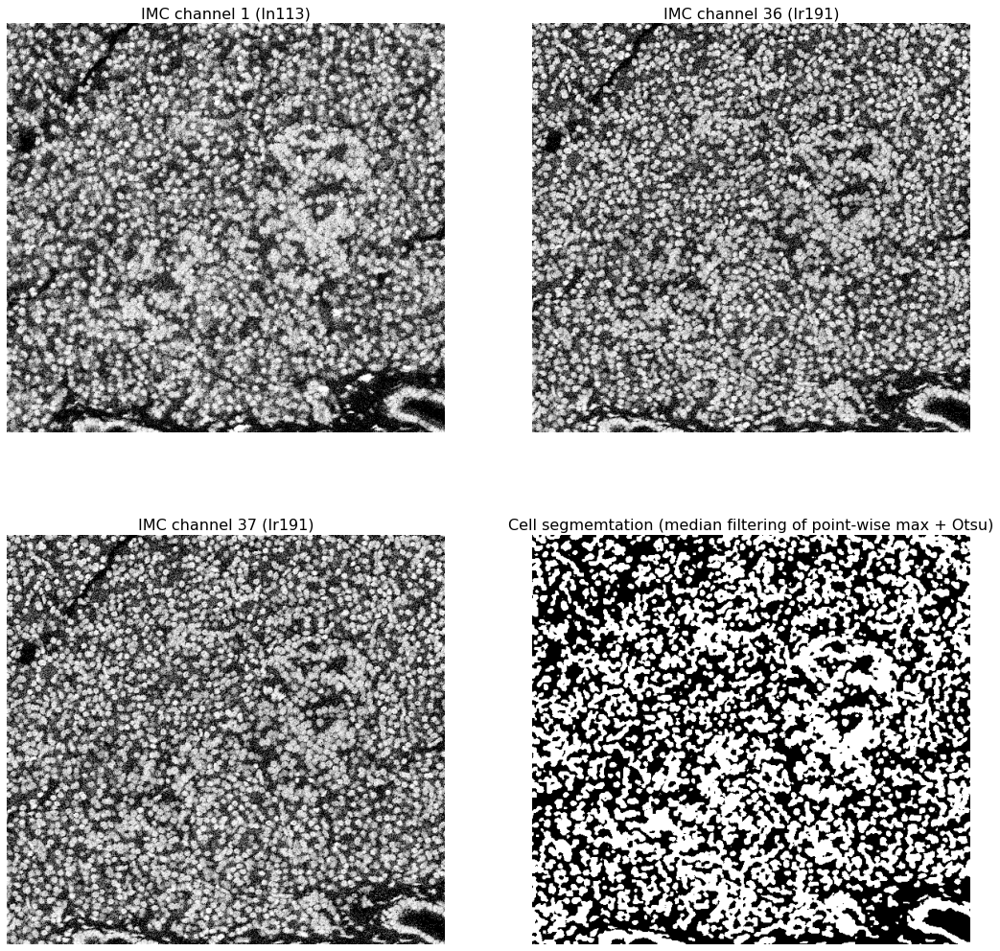

In [60]:
fig, axes = plt.subplots(2,2, figsize=(18,18))
ax = axes.ravel()
chn0 = np.flip(np.squeeze(im[c[0],:,:]), axis=0)
ax[0].imshow(hist_eq(chn0), cmap='gray', origin='lower')
ax[0].set(xlabel="")
ax[0].axis('off')
ax[0].set_title('IMC channel %d (%s)' % (c[0]+1, df.chn.iloc[c[0]]), size=16)

chn1 = np.flip(np.squeeze(im[c[1],:,:]), axis=0)
ax[1].imshow(hist_eq(chn1), cmap='gray', origin='lower')
ax[1].set(xlabel="")
ax[1].axis('off')
ax[1].set_title('IMC channel %d (%s)' % (c[1]+1, df.chn.iloc[c[1]]), size=16)

chn2 = np.flip(np.squeeze(im[c[2],:,:]), axis=0)
ax[2].imshow(hist_eq(chn1), cmap='gray', origin='lower')
ax[2].set(xlabel="")
ax[2].axis('off')
ax[2].set_title('IMC channel %d (%s)' % (c[2]+1, df.chn.iloc[c[1]]), size=16)


chn01 = np.maximum(chn0, chn1)  # point-wise maximum of the two DNA channels
chn = np.maximum(chn01, chn2)  # point-wise maximum of the all three channels
chn_eq = hist_eq(chn) # histogram equalization
r = 2
chn_eq_med = median(chn_eq, disk(r)) # median filtering

# Some mathematical morphology to consider:
# see: https://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_regional_maxima.html
# https://scikit-image.org/docs/dev/auto_examples/filters/plot_tophat.html

t = threshold_otsu(chn_eq_med)
mask = chn_eq_med > t

# mask = ndimage.median_filter(hist_eq(chn)

ax[3].imshow(mask, cmap='gray', origin='lower')
ax[3].set_title('Cell segmemtation (median filtering of point-wise max + Otsu)', size=16)
ax[3].axis('off')
plt.show()

In [61]:
# The cell candidate mask (to be saved to TIFF)
print(mask.min(), mask.max())
mask = np.flip(img_as_ubyte(mask), axis=0)
print(mask.min(), mask.max())

False True
0 255


In [62]:
# Save cell mask as tiff
#tiff.imsave('%s/Desktop/cell_mask.tiff' % (home), mask)
tiff.imsave('./data/E08_cell_candidate_mask.tiff', mask)

## Make a Pandas dataframe of all pixel signatures within the cell candidate mask

#### Channel names

In [63]:
chn_names = list(df.chn.iloc[:])

In [64]:
# Since cells are all over the slide, we could also let this ROI be the whole first channel in the slide stack + 1, i.e.
im_msk = im[0,:,:]+1
print(im_msk.flatten().min())
print(im_msk.flatten().max())
im_msk.shape

1.0
378.168


(530, 567)

### However, we will use a restricted ROI mask for the cells in the slide.
**Find voxel locations (ind_roi) corresponding to cell ROI (value >=1 inside ROI, 0 else) using Numpy's `where`**

In [65]:
ind_roi = np.where(mask > 0)
print('Total number of pixels: %d, Number of pixels within cell candidates: %d (%.1f%%)' % \
      (len(im_msk.flatten()), len(ind_roi[0]), 100*len(ind_roi[0])/len(im_msk.flatten())))

Total number of pixels: 300510, Number of pixels within cell candidates: 150526 (50.1%)


### Extracting a dataset X and the corresponding pixel locations into a Pandas data frame (dfROI)

In [66]:
X = np.transpose(np.asarray(im[:,ind_roi[0],ind_roi[1]])) # The pixel channel signatures within the ROI
print(X.shape)
dfROI = pd.DataFrame(X, columns = zip(range(len(chn_names)), chn_names))

(150526, 37)


### Check feature vectors (CyTOF pixel signatures) for the ten first pixels within the cells ROI

In [67]:
dfROI.head(10).T   # .T as column vectors

,0,1,2,3,4,5,6,7,8,9
"(0, In113)",11.754000,18.483999,15.564000,19.813000,9.268000,8.750000,6.564,3.391000,21.261999,16.070999
"(1, In115)",3.143000,1.332000,3.129000,2.000000,1.000000,2.000000,1.000,1.361000,1.000000,0.000000
"(2, Pr141)",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000
"(3, Nd142)",1.000000,1.275000,0.000000,0.000000,0.000000,1.026000,0.000,2.000000,2.000000,0.000000
"(4, Nd143)",8.871000,3.000000,1.000000,0.000000,1.000000,4.491000,4.778,2.466000,0.000000,1.497000
"(5, Nd144)",5.189000,3.032000,2.126000,3.000000,0.000000,2.814000,0.000,0.000000,0.000000,1.532000
"(6, Nd145)",0.000000,0.000000,1.912000,0.000000,0.000000,1.000000,0.000,0.000000,1.000000,0.000000
"(7, Nd146)",2.414000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000
"(8, Sm147)",0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,4.095000
"(9, Nd148)",6.969000,4.158000,0.000000,0.000000,0.000000,0.758000,2.105,3.590000,3.000000,6.821000


### Check feature vectors (CyTOF pixel signatures) for the ten last pixels within the ROI

In [68]:
dfROI.tail(10).T

,150516,150517,150518,150519,150520,150521,150522,150523,150524,150525
"(0, In113)",21.837999,21.924999,18.957001,35.752998,27.349001,14.342000,30.667000,29.274000,23.422001,16.829
"(1, In115)",5.675000,4.000000,1.274000,1.000000,4.664000,2.000000,2.838000,1.853000,0.000000,4.459
"(2, Pr141)",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000
"(3, Nd142)",0.000000,0.000000,0.000000,0.000000,1.213000,0.000000,0.000000,0.000000,0.000000,0.000
"(4, Nd143)",0.000000,1.000000,0.000000,1.468000,0.000000,0.000000,0.000000,0.000000,1.029000,0.000
"(5, Nd144)",0.000000,1.000000,2.000000,0.000000,0.000000,2.000000,1.282000,1.751000,1.344000,3.032
"(6, Nd145)",0.000000,0.000000,0.000000,1.316000,0.000000,0.000000,0.000000,2.413000,0.000000,0.000
"(7, Nd146)",0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.037000,0.000000,0.000
"(8, Sm147)",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000
"(9, Nd148)",0.000000,0.000000,6.463000,0.000000,1.674000,0.000000,0.000000,0.000000,3.779000,0.000


### Insert pixel locations (row,col) from the ROI into the dfROI data frame

In [69]:
dfROI.insert(loc = len(dfROI.columns),
           column = 'row',
           value = ind_roi[0])  # Row of pixel location
dfROI.insert(loc = len(dfROI.columns),
           column = 'col',
           value = ind_roi[1])  # Col of pixel location

### and inspect the result

In [70]:
print(dfROI.columns[0],',...,',dfROI.columns[-3], ',', dfROI.columns[-2],',', dfROI.columns[-1])

(0, 'In113') ,..., (36, 'Ir193') , row , col


In [71]:
print(dfROI.iloc[0][-3:])
print(dfROI.iloc[-1][-3:])

(36, Ir193)    18.249001
row             0.000000
col             1.000000
Name: 0, dtype: float64
(36, Ir193)     27.128
row            529.000
col            566.000
Name: 150525, dtype: float64


## Restriction to a small, quadratic 64 x 64 ROI within the slide

(64, 64)
(530, 567)


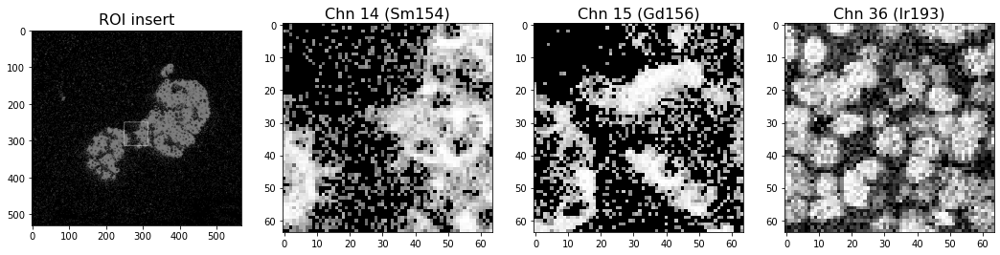

In [72]:
my_chn = [14, 15, 36]

rl=250; ru=314
cl=250; cu=314
msk2 = hist_eq(im[my_chn[0],rl:ru, cl:cu])+1
print(msk2.shape)

ima = hist_eq(np.squeeze(im[my_chn[0],:, :]))
print(ima.shape)
mx = hist_eq(im[my_chn[0],:,:]).max()*2
ima[rl:ru,cl] = mx
ima[rl:ru,cu] = mx
ima[rl,cl:cu] = mx
ima[ru,cl:cu] = mx


fig, axes = plt.subplots(1,4, figsize=(18,15))
plt.subplot(1,4,1)
plt.imshow(ima, cmap='gray')
plt.title('ROI insert', size=16)
plt.subplot(1,4,2)
plt.imshow(hist_eq(im[my_chn[0],rl:ru, cl:cu]), cmap='gray')
plt.title('Chn %d (%s)' % (my_chn[0], chn_names[my_chn[0]]), size=16)
plt.subplot(1,4,3)
plt.imshow(hist_eq(im[my_chn[1],rl:ru, cl:cu]), cmap='gray')
plt.title('Chn %d (%s)' % (my_chn[1], chn_names[my_chn[1]]), size=16)
plt.subplot(1,4,4)
plt.imshow(hist_eq(im[my_chn[2],rl:ru, cl:cu]), cmap='gray')
plt.title('Chn %d (%s)' % (my_chn[2], chn_names[my_chn[2]]), size=16)
plt.show()

### Make a multichannel IMC image of the small 64 x 64 ROI insert

In [73]:
roi_insert = np.zeros(shape=(msk2.shape[0], msk2.shape[1], 1, len(chn_names)))
roi_insert_eq = np.zeros(shape=(msk2.shape[0], msk2.shape[1], 1, len(chn_names)))
print(roi_insert.shape)
for i in range(len(chn_names)):
    a = im[i,rl:ru, cl:cu]
    b = hist_eq(im[i,rl:ru, cl:cu])
    roi_insert[:,:,0,i] = a  # /a.max()
    roi_insert_eq[:,:,0,i] = b  # /b.max()

(64, 64, 1, 37)


### Make a neuroimaging NIFTI-formated multichannel image (for using neuroimaging tools like FreeView)

In [37]:
roi_nii = nib.Nifti1Image(roi_insert, affine=np.eye(4))
roi_nii_eq = nib.Nifti1Image(roi_insert_eq, affine=np.eye(4))  # "histogram equalized channels" image

#### Save this NIFT image to disk

In [38]:
nib.save(roi_nii, './data/roi_insert.nii.gz')
nib.save(roi_nii_eq, './data/roi_insert_eq.nii.gz')

# K-means clustering using scikit-learn

### Cell segmentation using the 3 nucleus channels: Histone H3 nuclei (chn1) and DNA (chn36, chn 37)

In [39]:
# Select channels (-1 i.e. we are starting at channel 0)
c = [0, 35, 36]

In [40]:
# Generally, we could use a restricted ROI mask for the cells in the slide. 
# Since cells are all over the slide, we let this ROI be the whole first channel in the slide stack + 1, i.e.
im_msk = im[0,:,:]+1
print(im_msk.flatten().min())
print(im_msk.flatten().max())
im_msk.shape

1.0
378.168


(530, 567)

In [41]:
# Find voxel locations (ind_roi) corresponding to tissue ROI (value >=1 inside ROI, 0 else) 
ind_roi = np.where(im_msk > 0) 

#### Make it into RGB space

In [42]:
r = np.squeeze(im[c[0],:,:]); r = hist_eq(r); r = np.uint8(255.0 * r/np.max(r))
g = np.squeeze(im[c[1],:,:]); g = hist_eq(g); g = np.uint8(255.0 * g/np.max(g))
b = np.squeeze(im[c[2],:,:]); b = hist_eq(b); b = np.uint8(255.0 * b/np.max(b))

dims = list(np.squeeze(im[0,:,:]).shape)
dims.append(3)
dna_rgb = np.zeros(shape=dims, dtype=np.uint8)
dna_rgb[:,:,0] = r; dna_rgb[:,:,1] = g; dna_rgb[:,:,2] = b

print(dna_rgb.shape)
print(type(dna_rgb))
print(dna_rgb.dtype)
mx = np.max(color.rgb2gray(dna_rgb))

tiff.imsave('%s/tmp/dna_rgb.tiff' % (home), dna_rgb)
tiff.imsave('%s/tmp/dna_rgb2gray.tiff' % (home), np.uint8(255*color.rgb2gray(dna_rgb)/mx))

(530, 567, 3)
<class 'numpy.ndarray'>
uint8


In [43]:
dims = np.prod(np.squeeze(im[0,:,:]).shape)
dataset = np.zeros(shape=[dims, 3]) # , dtype=np.uint8)
dataset[:,0] = r.flatten()
dataset[:,1] = g.flatten()
dataset[:,2] = b.flatten()
dataset.shape

(300510, 3)

In [44]:
data = pd.DataFrame(data=dataset, columns=['chn01', 'chn36', 'chn37'])
data

,chn01,chn36,chn37
0,42.0,97.0,0.0
1,191.0,132.0,168.0
2,221.0,253.0,245.0
3,210.0,249.0,251.0
4,226.0,241.0,251.0
...,...,...,...
300505,205.0,229.0,237.0
300506,245.0,247.0,252.0
300507,244.0,240.0,241.0
300508,234.0,216.0,209.0


In [45]:
scaler = StandardScaler()  
scaler.fit(data.astype(float))

dna_names = df.chn[c]
X = data
X_scaled = scaler.transform(X.astype(float))  

# Make data frame from scaled X to check scaling
dX_scaled = pd.DataFrame(X_scaled, columns=dna_names)
dX_scaled.head().T

,0,1,2,3,4
chn,,,,,
In113,-1.091671,0.864903,1.258844,1.114399,1.324501
Ir191,-0.327223,0.115113,1.644330,1.593777,1.492672
Ir193,-1.672050,0.559668,1.582538,1.662243,1.662243


In [46]:
dX_scaled.describe(percentiles = [0.5]).round(4).T

,count,mean,std,min,50%,max
chn,,,,,,
In113,300510.0,-0.0,1.0,-1.6432,0.0245,1.7053
Ir191,300510.0,0.0,1.0,-1.5531,0.0519,1.6696
Ir193,300510.0,-0.0,1.0,-1.6721,0.0150,1.7154


In [47]:
K = 4  # Number of clusters (cell / no-cell / intermediate)
max_iter = 300 # Max number of iteration
tol = 0.0001 # Tolerance
kmeans_model = KMeans(n_clusters=K, random_state=42, max_iter=max_iter, tol=tol)
print(kmeans_model)

KMeans(n_clusters=4, random_state=42)


In [48]:
%%time
kmeans_fit = kmeans_model.fit(X_scaled)

CPU times: user 28.3 s, sys: 1.07 s, total: 29.3 s
Wall time: 1.99 s


In [49]:
kmeans_segm = 0 * im_msk.copy()
print('Size of segmented image:', kmeans_segm.shape)
print('min:', kmeans_fit.labels_.min())
print('max:', kmeans_fit.labels_.max())
print('Number of clustered samples within ROI:', len(ind_roi[0]))

Size of segmented image: (530, 567)
min: 0
max: 3
Number of clustered samples within ROI: 300510


In [50]:
kmeans_segm = np.ravel(np.ones(dims)*kmeans_fit.labels_).reshape(np.squeeze(im[0,:,:]).shape)
kmeans_segm = np.uint8(kmeans_segm)
print(kmeans_segm.shape)
print(np.int8(kmeans_segm.min()), np.int8(kmeans_segm.max()))
unique, counts = np.unique(kmeans_segm, return_counts=True)
dict(zip(np.int8(unique), counts))

(530, 567)
0 3


{0: 78911, 1: 82403, 2: 69026, 3: 70170}

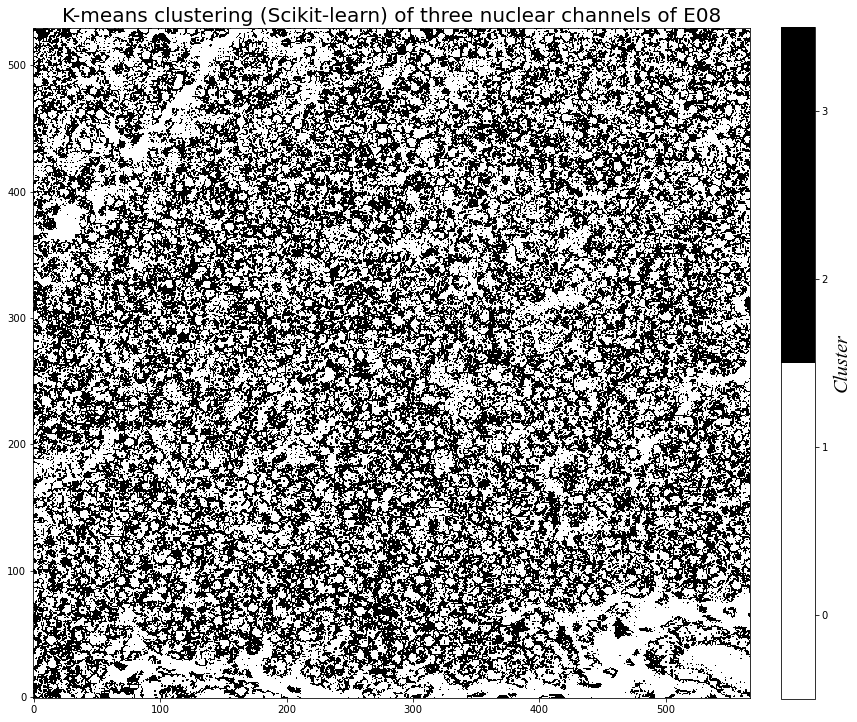

In [51]:
fig, axes = plt.subplots(1,1, figsize=(14,14))
# Possible colormaps: 'gray', 'jet', 'cubehelix', 
my_cmap = mpl.colors.ListedColormap(['#ffffff', '#ffffff','#000000', '#000000']) # 'blue'])
#plt.imshow(np.flip(kmeans_segm[:, :], axis=0), cmap=discrete_cmap(K, 'gray'), origin='lower') 
plt.imshow(np.flip(kmeans_segm[:, :], axis=0), cmap=my_cmap, origin='lower') 

# See: https://stackoverflow.com/questions/18195758/set-matplotlib-colorbar-size-to-match-graph
im_ratio = kmeans_segm.shape[0]/kmeans_segm.shape[1]
cb = plt.colorbar(label='Cluster', orientation='vertical', fraction=0.046*im_ratio, pad=0.04)
ax = cb.ax
text = ax.yaxis.label
font = mpl.font_manager.FontProperties(family='times new roman', style='italic', size=20)
text.set_font_properties(font)


plt.clim(-0.5, K - 0.5)
labels = np.arange(0,K,1)
cb.set_ticks(labels)
cb.set_ticklabels(labels)



plt.title('K-means clustering (Scikit-learn) of three nuclear channels of E08', size=20)
plt.show()

In [52]:
tiff.imsave('%s/tmp/kmeans_segm.tiff' % (home), kmeans_segm)

### Unsupervised classification of the 2D+CyTOF IMC data using K-means
Let X be the n x p data matrix, n = numper of samples (pixel signatures), p = feature vector dimension (number of channels)

In [61]:
X.shape

(300510, 37)

In [62]:
chn_names = df.chn
chn_names[:5]

0    In113
1    In115
2    Pr141
3    Nd142
4    Nd143
Name: chn, dtype: object

In [63]:
# Make data frame from unscaled X to check scaling
dX_unscaled = pd.DataFrame(X, columns=chn_names)
dX_unscaled.describe(percentiles = [0.5]).round(4).T

,count,mean,std,min,50%,max
chn,,,,,,
In113,300510.0,8.5177,9.9722,0.0,5.181,377.1680
In115,300510.0,1.0210,1.8116,0.0,0.000,84.2350
Pr141,300510.0,0.2025,0.6047,0.0,0.000,24.3300
Nd142,300510.0,0.3015,0.6812,0.0,0.000,13.9050
Nd143,300510.0,1.2852,2.9146,0.0,0.000,71.6480
Nd144,300510.0,2.0594,5.3611,0.0,1.000,241.6350
Nd145,300510.0,4.3234,10.2152,0.0,1.000,164.4120
Nd146,300510.0,0.5158,1.3196,0.0,0.000,59.8750
Sm147,300510.0,0.3839,2.1355,0.0,0.000,136.5310


### Scaling* of feature vectors (IMC signals), channel-by-channel wthin the ROI mask
*) Scaling to zero mean and unit standard deviation

In [64]:
scaler = StandardScaler()  
scaler.fit(X.astype(float))

X_scaled = scaler.transform(X.astype(float))  

# Make data frame from scaled X to check scaling
dX_scaled = pd.DataFrame(X_scaled, columns=chn_names)
dX_scaled.head().T

,0,1,2,3,4
chn,,,,,
In113,-0.747246,0.324537,0.999415,0.706600,1.132686
In115,-0.563615,1.171339,0.171656,1.163610,0.540396
Pr141,-0.334873,-0.334873,-0.334873,-0.334873,-0.334873
Nd142,-0.442636,1.025362,1.429061,-0.442636,-0.442636
Nd143,3.811833,2.602732,0.588363,-0.097846,-0.440951
Nd144,0.059062,0.583768,0.181425,0.012429,0.175456
Nd145,-0.325340,-0.423234,-0.423234,-0.236061,-0.423234
Nd146,-0.390886,1.438514,-0.390886,-0.390886,-0.390886
Sm147,-0.179775,-0.179775,-0.179775,0.288491,-0.179775


In [65]:
dX_scaled.describe(percentiles = [0.5]).round(4).T

,count,mean,std,min,50%,max
chn,,,,,,
In113,300510.0,0.0,1.0,-0.8541,-0.3346,36.9679
In115,300510.0,-0.0,1.0,-0.5636,-0.5636,45.9346
Pr141,300510.0,-0.0,1.0,-0.3349,-0.3349,39.9033
Nd142,300510.0,-0.0,1.0,-0.4426,-0.4426,19.9699
Nd143,300510.0,-0.0,1.0,-0.4410,-0.4410,24.1418
Nd144,300510.0,-0.0,1.0,-0.3841,-0.1976,44.6878
Nd145,300510.0,0.0,1.0,-0.4232,-0.3253,15.6717
Nd146,300510.0,0.0,1.0,-0.3909,-0.3909,44.9841
Sm147,300510.0,-0.0,1.0,-0.1798,-0.1798,63.7531


**Fit the K-means model to the data (and time it)**

In [66]:
K = 7  # Number of clusters
max_iter = 300 # Max number of iteration
tol = 0.0001 # Tolerance
kmeans_model = KMeans(n_clusters=K, random_state=42, max_iter=max_iter, tol=tol)
print(kmeans_model)

KMeans(n_clusters=7, random_state=42)


In [67]:
%%time
kmeans_fit = kmeans_model.fit(X_scaled)

CPU times: user 1min 33s, sys: 1.58 s, total: 1min 35s
Wall time: 6.33 s


In [68]:
print(kmeans_fit.labels_)
print('First centroid in p-dimensional feature vector space:\n', kmeans_fit.cluster_centers_[0,:])

[4 4 0 ... 0 4 0]
First centroid in p-dimensional feature vector space:
 [ 1.21843906  0.49083214 -0.03832607 -0.10059465 -0.2269227  -0.17524045
 -0.25649514 -0.1586747  -0.05497639 -0.28425862  0.0032     -0.15045402
 -0.0282817  -0.01304185 -0.10484276 -0.10329715  0.3464075  -0.03429125
 -0.23594693 -0.07057792 -0.04906081 -0.00928624 -0.05129641 -0.05523314
 -0.16694344 -0.14560205 -0.0812474   0.11341002 -0.04356759 -0.2089804
 -0.13503731 -0.29335455 -0.23643083  0.13949664 -0.04038111  1.51188364
  1.52539671]


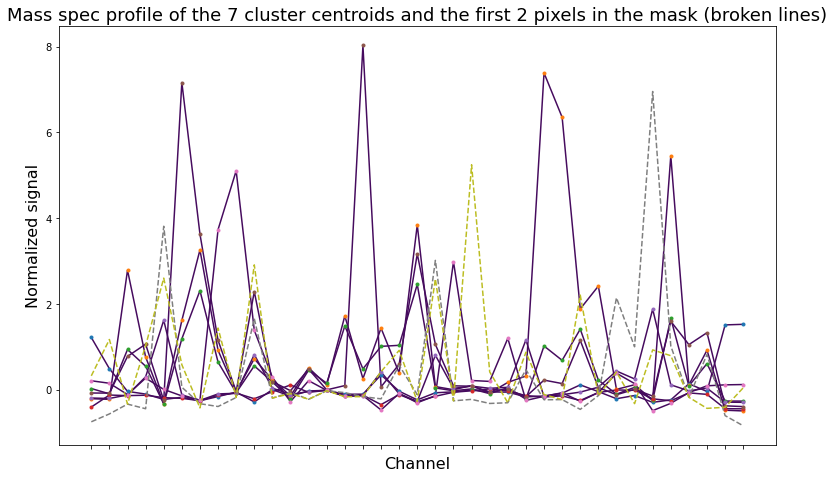

In [69]:
# Plot the cluster centroids as line plots

nv = 2

my_cmap = mpl.colors.ListedColormap(['red', '#000000','#444444', '#666666', '#ffffff', 'blue', 'orange'])
my_cmap_v = plt.cm.viridis(K)

fig, ax = plt.subplots(1,1)

fig.set_size_inches(12, 7)

plt.plot(kmeans_fit.cluster_centers_.T, color=my_cmap_v)
plt.plot(kmeans_fit.cluster_centers_.T, '.')
plt.plot(X_scaled[:nv, :].T, '--')
plt.xlabel('Channel', fontsize=16)
ax.set_xticks([x for x in range(X_scaled.shape[1])])
ax.set_xticklabels([], rotation='vertical', fontsize=18)
plt.ylabel('Normalized signal', fontsize=16)
#plt.xlim(0, 3)
plt.title('Mass spec profile of the %d cluster centroids and the first %d pixels in the mask (broken lines)' % (K, nv), fontsize=18)

plt.subplots_adjust(bottom=.12, top=.95, right=.95, left=.12)

plt.show()

**Make a k-means segmented image (segmentation restricted to the ROI)**

In [70]:
kmeans_segm = 0 * im_msk.copy()
print('Size of segmented image:', kmeans_segm.shape)
print('min:', kmeans_fit.labels_.min())
print('max:', kmeans_fit.labels_.max())
print('Number of clustered samples within ROI:', len(ind_roi[0]))

Size of segmented image: (530, 567)
min: 0
max: 6
Number of clustered samples within ROI: 300510


**Assign the cluster belonging to each voxel within the ROI**

In [71]:
for v in range(len(ind_roi[0])):
    kmeans_segm[ind_roi[0][v], ind_roi[1][v]] = kmeans_fit.labels_[v]

In [72]:
# https://gist.github.com/jakevdp/91077b0cae40f8f8244a  By Jake VanderPlas
def discrete_cmap(N, base_cmap=None):
    """Create an N-bin discrete colormap from the specified input map"""

    # Note that if base_cmap is a string or None, you can simply do
    #    return plt.cm.get_cmap(base_cmap, N)
    # The following works for string, None, or a colormap instance:

    base = plt.cm.get_cmap(base_cmap)
    color_list = base(np.linspace(0, 1, N))
    cmap_name = base.name + str(N)
    return base.from_list(cmap_name, color_list, N)

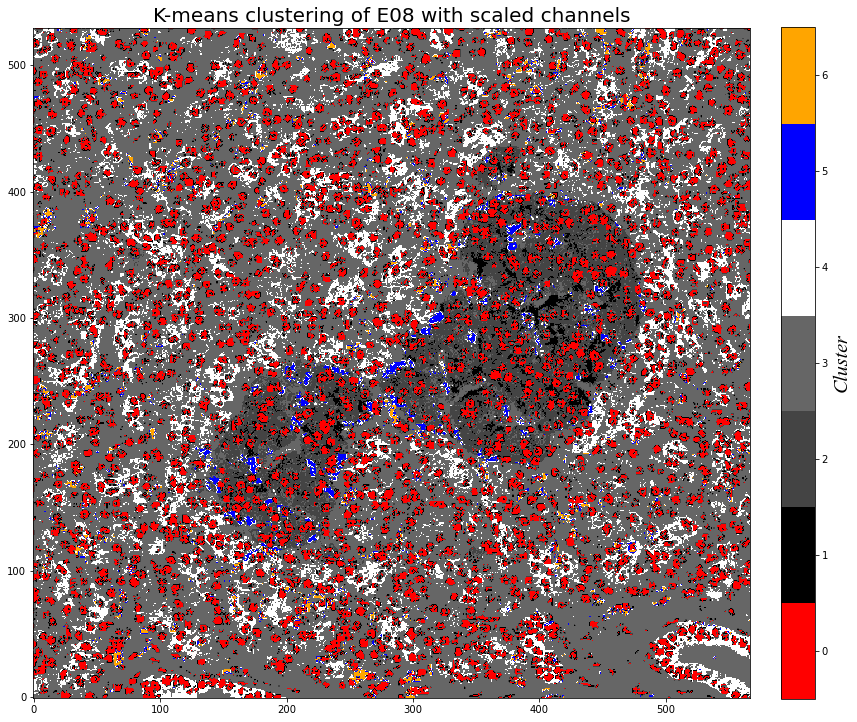

In [73]:
fig, axes = plt.subplots(1,1, figsize=(14,14))
# Possible colormaps: 'gray', 'jet', 'cubehelix', 
my_cmap = mpl.colors.ListedColormap(['red', '#000000','#444444', '#666666', '#ffffff', 'blue', 'orange'])
#plt.imshow(np.flip(kmeans_segm[:, :], axis=0), cmap=discrete_cmap(K, 'gray'), origin='lower') 
plt.imshow(np.flip(kmeans_segm[:, :], axis=0), cmap=my_cmap, origin='lower') 

# See: https://stackoverflow.com/questions/18195758/set-matplotlib-colorbar-size-to-match-graph
im_ratio = kmeans_segm.shape[0]/kmeans_segm.shape[1]
cb = plt.colorbar(label='Cluster', orientation='vertical', fraction=0.046*im_ratio, pad=0.04)
ax = cb.ax
text = ax.yaxis.label
font = mpl.font_manager.FontProperties(family='times new roman', style='italic', size=20)
text.set_font_properties(font)

plt.clim(-0.5, K - 0.5)
plt.title('K-means clustering of E08 with scaled channels', size=20)
plt.show()

**The following function gives the largest connected segmentation which is not backgroud. The shape of input and output is the same which could be 2D or 3D images.**
https://stackoverflow.com/questions/47540926/get-the-largest-connected-component-of-segmentation-image

In [74]:
import numpy as np
from skimage.measure import label

def getLargestCC(segmentation):
    labels = label(segmentation)
    unique, counts = np.unique(labels, return_counts=True)
    list_seg=list(zip(unique, counts))[1:] # the 0 label is by default background so take the rest
    largest=max(list_seg, key=lambda x:x[1])[0]
    labels_max=(labels == largest).astype(int)
    return labels_max

In [75]:
kmeans_segm_max = getLargestCC(kmeans_segm)

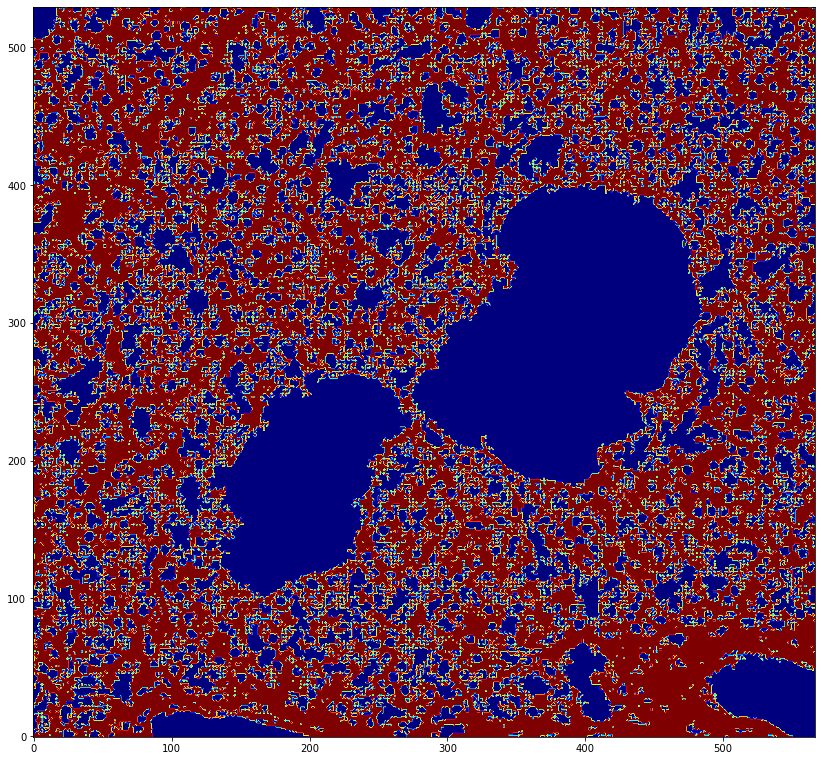

In [76]:
fig, axes = plt.subplots(1,1, figsize=(14,14))
plt.imshow(np.flip(kmeans_segm_max[:, :], axis=0), cmap='jet', origin='lower')
plt.show()

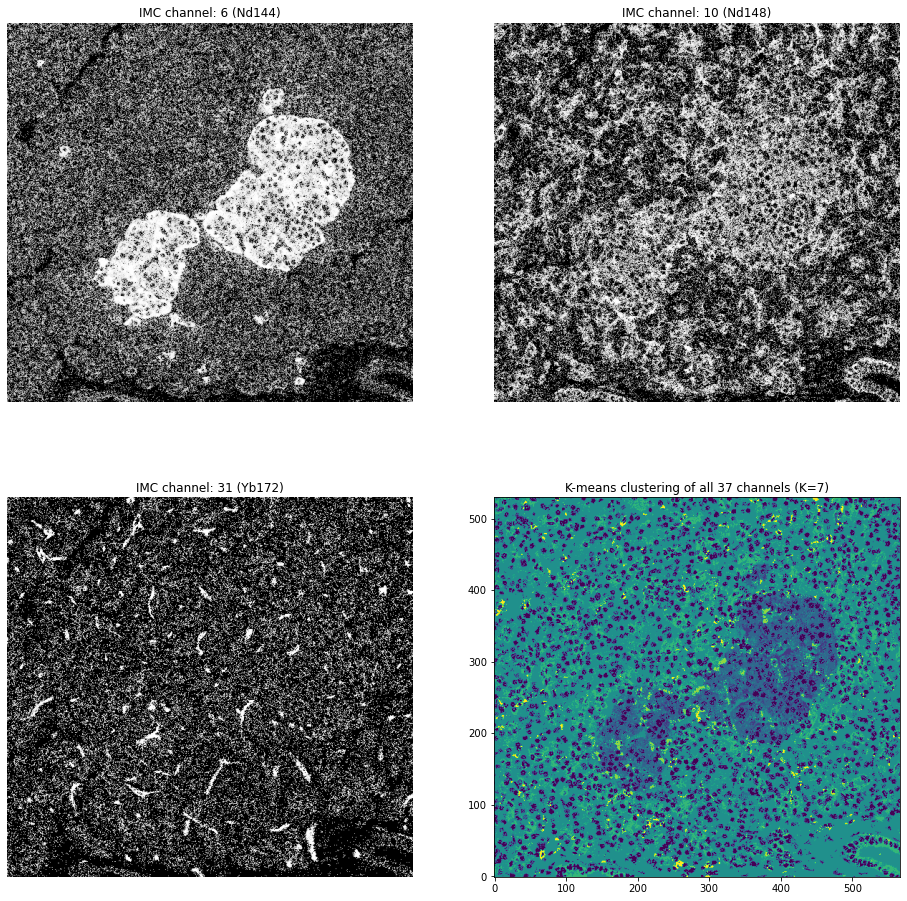

In [77]:
# Select channels (-1 i.e. we are starting at channel 0)
c = [5, 9, 30]

def hist_eq(chn):
    return np.sort(chn.ravel()).searchsorted(chn)


fig, axes = plt.subplots(2,2, figsize=(16,16))
ax = axes.ravel()
chn = np.flip(np.squeeze(im[c[0],:,:]), axis=0)
ax[0].imshow(hist_eq(chn), cmap='gray', origin='lower')
ax[0].set(xlabel="")
ax[0].axis('off')
ax[0].set_title('IMC channel: %d (%s)' % (c[0]+1, df.chn.iloc[c[0]]))

chn = np.flip(np.squeeze(im[c[1],:,:]), axis=0)
ax[1].imshow(hist_eq(chn), cmap='gray', origin='lower')
ax[1].set(xlabel="")
ax[1].axis('off')
ax[1].set_title('IMC channel: %d (%s)' % (c[1]+1, df.chn.iloc[c[1]]))

chn = np.flip(np.squeeze(im[c[2],:,:]), axis=0)
ax[2].imshow(hist_eq(chn), cmap='gray', origin='lower')
ax[2].set(xlabel="")
ax[2].axis('off')
ax[2].set_title('IMC channel: %d (%s)' % (c[2]+1, df.chn.iloc[c[2]]))

ax[3].imshow(np.flip(kmeans_segm[:, :], axis=0), cmap='viridis', origin='lower')  #'viridis', 'gray'
ax[3].set_title('K-means clustering of all %d channels (K=%d)' % (n_chn, K))

#plt.tight_layout
plt.show()

Check: https://github.com/computational-medicine/BMED360-2020/blob/master/perfusion/01-perf-explore.ipynb for more